In [1]:
#1-
!pip install gdown

import gdown, zipfile, os

# ---- مشخصات فایل ----
file_id = "1RdxkWe1JM-GADdtDf6QpNN3tGgmNEvIE"   # همون id از لینکت
destination = "BookCovers-5-full-c.zip"                      # اسم فایل نهایی

# ---- دانلود ----
gdown.download(f"https://drive.google.com/uc?id={file_id}", destination, quiet=False)

# ---- اگر فایل zip بود، اکسترکت کن ----
if destination.endswith(".zip"):
    extract_path = "extracted_files"
    os.makedirs(extract_path, exist_ok=True)

    with zipfile.ZipFile(destination, 'r') as zip_ref:
        zip_ref.extractall(extract_path)

    print(f"✅ فایل {destination} در پوشه {extract_path} اکسترکت شد.")


Downloading...
From (original): https://drive.google.com/uc?id=1RdxkWe1JM-GADdtDf6QpNN3tGgmNEvIE
From (redirected): https://drive.google.com/uc?id=1RdxkWe1JM-GADdtDf6QpNN3tGgmNEvIE&confirm=t&uuid=a070b95d-2c9a-4ac2-9486-e0ba1100fdac
To: /content/BookCovers-5-full-c.zip
100%|██████████| 92.4M/92.4M [00:05<00:00, 17.6MB/s]


✅ فایل BookCovers-5-full-c.zip در پوشه extracted_files اکسترکت شد.


In [2]:
#2-
#importing the essential libraries
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.layers import *
from tensorflow.keras.models import *
from tensorflow.keras.preprocessing import image
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from sklearn.metrics import confusion_matrix, classification_report
import itertools
################
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam, RMSprop
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow.keras
from PIL import Image, ImageOps
from tensorflow.keras.preprocessing.image import *
%matplotlib inline
from tensorflow import keras
from keras import *
import keras
import cv2
import os
from sklearn.metrics import confusion_matrix
import seaborn as sns
from tensorflow.keras import regularizers
from keras.regularizers import l2
from sklearn.metrics import f1_score, precision_score, recall_score

In [3]:
 #3-
 ! pip install unzip
 !unzip "/content/BookCovers-5-full-c.zip" -d "BookCovers-5-full-c"

  Preparing metadata (setup.py) ... done
  Created wheel for unzip: filename=unzip-1.0.0-py3-none-any.whl size=1281 sha256=59a3784310ac869c71bf16a64d9d7a5be4b7124643d83c35a7955774b868949f
  Stored in directory: /root/.cache/pip/wheels/fb/5b/81/0f3e1e533b52883f88ab978178c15627a4fce4c13f74911dce
Successfully built unzip
Archive:  /content/BookCovers-5-full-c.zip
   creating: BookCovers-5-full-c/BookCovers-5-full-c/
   creating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/3 (1).jpg  
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/3 (10).jpg  
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/3 (100).jpg  
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/3 (101).jpg  
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/falsafe va ravanshenasi/3 (102).jpg  
  inflating: BookCovers-5-full-c/BookCovers-5-full-c/

In [4]:
#5-
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 55.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 30.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.2/296.2 kB 13.4 MB/s eta 0:00:00


In [5]:
# ============================================================
# STRATIFIED DATASET SPLIT
# Train = 80%
# Validation = 10%
# Test = 10%
# ============================================================

import os
import shutil
from pathlib import Path

from sklearn.model_selection import train_test_split


# ------------------------------------------------------------
# 1. ORIGINAL DATASET PATH
# ------------------------------------------------------------

src_root = Path(
    "/content/BookCovers-5-full-c/BookCovers-5-full-c"
)

# ------------------------------------------------------------
# 2. OUTPUT SPLIT PATH
# ------------------------------------------------------------

dst_root = Path(
    "/content/BookCovers-split"
)


# ------------------------------------------------------------
# 3. CHECK SOURCE DATASET
# ------------------------------------------------------------

if not src_root.exists():
    raise FileNotFoundError(
        f"Dataset path not found:\n{src_root}"
    )

print("Source dataset:")
print(src_root)

print("\nOutput directory:")
print(dst_root)


# ------------------------------------------------------------
# 4. REMOVE OLD SPLIT
# ------------------------------------------------------------

if dst_root.exists():

    print("\nRemoving previous split...")

    shutil.rmtree(dst_root)


# ------------------------------------------------------------
# 5. FIND CLASSES
# ------------------------------------------------------------

class_names = sorted([
    d.name
    for d in src_root.iterdir()
    if d.is_dir()
])

print("\nClasses:")
for i, cls in enumerate(class_names):
    print(f"{i}: {cls}")


# ------------------------------------------------------------
# 6. COLLECT ALL IMAGES
# ------------------------------------------------------------

valid_extensions = {
    ".jpg",
    ".jpeg",
    ".png",
    ".bmp",
    ".webp"
}

samples = []

for class_name in class_names:

    class_dir = src_root / class_name

    image_files = [
        p for p in class_dir.rglob("*")
        if p.is_file()
        and p.suffix.lower() in valid_extensions
    ]

    print(
        f"{class_name}: {len(image_files)} images"
    )

    for img_path in image_files:

        samples.append(
            (
                str(img_path),
                class_name
            )
        )


# ------------------------------------------------------------
# 7. SEPARATE PATHS AND LABELS
# ------------------------------------------------------------

paths = [
    x[0]
    for x in samples
]

labels = [
    x[1]
    for x in samples
]


print("\nTotal images:", len(paths))


# ------------------------------------------------------------
# 8. STRATIFIED SPLIT
#
# First:
#       80% Train
#       20% Temporary
#
# Then Temporary:
#       50% Validation
#       50% Test
#
# Final:
#       80% Train
#       10% Validation
#       10% Test
# ------------------------------------------------------------

seed = 8


train_paths, temp_paths, train_labels, temp_labels = \
    train_test_split(
        paths,
        labels,
        test_size=0.20,
        random_state=seed,
        stratify=labels
    )


val_paths, test_paths, val_labels, test_labels = \
    train_test_split(
        temp_paths,
        temp_labels,
        test_size=0.50,
        random_state=seed,
        stratify=temp_labels
    )


# ------------------------------------------------------------
# 9. PRINT SPLIT SIZES
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("STRATIFIED SPLIT")
print("=" * 60)

print(
    f"Train      : {len(train_paths)} "
    f"({100 * len(train_paths) / len(paths):.2f}%)"
)

print(
    f"Validation : {len(val_paths)} "
    f"({100 * len(val_paths) / len(paths):.2f}%)"
)

print(
    f"Test       : {len(test_paths)} "
    f"({100 * len(test_paths) / len(paths):.2f}%)"
)

print(
    f"Total      : {len(paths)}"
)

print("=" * 60)


# ------------------------------------------------------------
# 10. CREATE OUTPUT DIRECTORIES
# ------------------------------------------------------------

split_data = {

    "train": (
        train_paths,
        train_labels
    ),

    "val": (
        val_paths,
        val_labels
    ),

    "test": (
        test_paths,
        test_labels
    )
}


for split_name in split_data.keys():

    for class_name in class_names:

        output_class_dir = (
            dst_root
            / split_name
            / class_name
        )

        output_class_dir.mkdir(
            parents=True,
            exist_ok=True
        )


# ------------------------------------------------------------
# 11. COPY FILES
# ------------------------------------------------------------

for split_name, (
    split_paths,
    split_labels
) in split_data.items():

    print(
        f"\nCreating {split_name} split..."
    )

    for src_path, label in zip(
        split_paths,
        split_labels
    ):

        src_path = Path(src_path)

        dst_path = (
            dst_root
            / split_name
            / label
            / src_path.name
        )

        shutil.copy2(
            src_path,
            dst_path
        )


# ------------------------------------------------------------
# 12. FINAL PATHS
# ------------------------------------------------------------

train_dir = str(
    dst_root / "train"
)

val_dir = str(
    dst_root / "val"
)

test_dir = str(
    dst_root / "test"
)


# ------------------------------------------------------------
# 13. VERIFY OUTPUT
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("FINAL DATASET PATHS")
print("=" * 60)

print("Train:")
print(train_dir)

print("\nValidation:")
print(val_dir)

print("\nTest:")
print(test_dir)

print("=" * 60)


# ------------------------------------------------------------
# 14. VERIFY CLASS DISTRIBUTION
# ------------------------------------------------------------

print("\n" + "=" * 60)
print("CLASS DISTRIBUTION")
print("=" * 60)


for split_name in [
    "train",
    "val",
    "test"
]:

    print(f"\n[{split_name.upper()}]")

    total_split = 0

    for class_name in class_names:

        class_dir = (
            dst_root
            / split_name
            / class_name
        )

        count = sum(
            1
            for p in class_dir.iterdir()
            if p.is_file()
        )

        total_split += count

        print(
            f"{class_name:<30} {count}"
        )

    print(
        f"Total = {total_split}"
    )


# ------------------------------------------------------------
# 15. VERIFY IMAGEFOLDER COMPATIBILITY
# ------------------------------------------------------------

from torchvision import datasets

train_check = datasets.ImageFolder(
    train_dir
)

val_check = datasets.ImageFolder(
    val_dir
)

test_check = datasets.ImageFolder(
    test_dir
)


print("\n" + "=" * 60)
print("CLASS MAPPING CHECK")
print("=" * 60)

print(
    "Train:",
    train_check.class_to_idx
)

print(
    "Validation:",
    val_check.class_to_idx
)

print(
    "Test:",
    test_check.class_to_idx
)


assert (
    train_check.class_to_idx
    == val_check.class_to_idx
    == test_check.class_to_idx
), "ERROR: Class mappings are different!"

print(
    "\n✓ Class mappings are identical."
)

print(
    "\n✓ Stratified 80/10/10 split completed successfully."
)

Source dataset:
/content/BookCovers-5-full-c/BookCovers-5-full-c

Output directory:
/content/BookCovers-split

Classes:
0: falsafe va ravanshenasi
1: koliat
2: olum ejtemai
3: olum mahz
4: zaban
falsafe va ravanshenasi: 359 images
koliat: 380 images
olum ejtemai: 344 images
olum mahz: 334 images
zaban: 356 images

Total images: 1773

STRATIFIED SPLIT
Train      : 1418 (79.98%)
Validation : 177 (9.98%)
Test       : 178 (10.04%)
Total      : 1773

Creating train split...

Creating val split...

Creating test split...

FINAL DATASET PATHS
Train:
/content/BookCovers-split/train

Validation:
/content/BookCovers-split/val

Test:
/content/BookCovers-split/test

CLASS DISTRIBUTION

[TRAIN]
falsafe va ravanshenasi        287
koliat                         304
olum ejtemai                   275
olum mahz                      267
zaban                          285
Total = 1418

[VAL]
falsafe va ravanshenasi        36
koliat                         38
olum ejtemai                   34
olum mahz   

In [6]:
from collections import Counter
from pathlib import Path

def get_class_distribution(split_dir):

    split_dir = Path(split_dir)

    counts = {}

    for class_dir in sorted(split_dir.iterdir()):

        if not class_dir.is_dir():
            continue

        count = sum(
            1
            for p in class_dir.rglob("*")
            if p.is_file()
        )

        counts[class_dir.name] = count

    return counts


train_counts = get_class_distribution(train_dir)
val_counts   = get_class_distribution(val_dir)
test_counts  = get_class_distribution(test_dir)


all_classes = sorted(
    set(train_counts)
    | set(val_counts)
    | set(test_counts)
)


print("\n" + "=" * 70)
print("CLASS DISTRIBUTION")
print("=" * 70)

print(
    f"{'Class':<25}"
    f"{'Train':>10}"
    f"{'Val':>10}"
    f"{'Test':>10}"
    f"{'Total':>10}"
)

print("-" * 70)

for cls in all_classes:

    tr = train_counts.get(cls, 0)
    va = val_counts.get(cls, 0)
    te = test_counts.get(cls, 0)

    print(
        f"{cls:<25}"
        f"{tr:>10}"
        f"{va:>10}"
        f"{te:>10}"
        f"{tr + va + te:>10}"
    )

print("=" * 70)


CLASS DISTRIBUTION
Class                         Train       Val      Test     Total
----------------------------------------------------------------------
falsafe va ravanshenasi         287        36        36       359
koliat                          304        38        38       380
olum ejtemai                    275        34        35       344
olum mahz                       267        34        33       334
zaban                           285        35        36       356


In [7]:
#ba nemodar loss,tsne#fusion model embeding 256
# =========================
# Multi-Stage Vision/Text → Late Fusion Classifier (with EMA) + Metrics/Plots/TSNE/CM
# =========================

# -------- Libraries --------
import os, re, random, copy
import math
import torch, torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms, models
from transformers import AutoTokenizer, AutoModel, get_linear_schedule_with_warmup
from torch.optim import AdamW
import pandas as pd
import numpy as np
import easyocr
from PIL import Image
import torch.nn.functional as F

# extra for metrics/plots
from sklearn.metrics import f1_score, confusion_matrix, recall_score
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# -------- Parameters --------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
num_classes = 5

# paths
train_dir = "/content/BookCovers-split/train"
val_dir   = "/content/BookCovers-split/val"
test_dir  = "/content/BookCovers-split/test"
ocr_cache_dir = "ocr_cache"
os.makedirs(ocr_cache_dir, exist_ok=True)
train_csv = os.path.join(ocr_cache_dir, "train.csv")
test_csv  = os.path.join(ocr_cache_dir, "test.csv")
val_csv   = os.path.join(ocr_cache_dir, "validation.csv")

# results root
RESULTS_DIR = "results"
os.makedirs(RESULTS_DIR, exist_ok=True)

# common
torch.manual_seed(seed); random.seed(seed); np.random.seed(seed)


import torch, numpy as np, random, os

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    # برای جلوگیری از non-deterministic بودن cuDNN
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(seed)
# ======= Helpers: text cleaning / OCR CSV =======
def clean_ocr_text(text: str) -> str:
    text = (text or "").lower()
    text = re.sub(r"[^a-zA-Z0-9\u0600-\u06FF\s]", " ", text)
    text = text.replace("ي","ی")
    text = text.replace("ك","ک")
    return " ".join(text.split()).strip()

def build_ocr_csv(imagefolder_dir, csv_path, use_gpu=True):
    if os.path.exists(csv_path):
        print(f"[!] CSV exists: {csv_path}")
        return
    print(f"[+] Building OCR CSV for: {imagefolder_dir}")
    reader = easyocr.Reader(['en','fa'], gpu=use_gpu)
    img_folder = datasets.ImageFolder(imagefolder_dir)
    rows = []
    for path, label in img_folder.samples:
        try:
            text_list = reader.readtext(path, detail=0)
            text = " ".join(text_list) if len(text_list) > 0 else "empty"
        except Exception as e:
            print(f"[OCR ERROR] {path}: {e}")
            text = "empty"
        rows.append({"path": path, "label": label, "text": text})
    df = pd.DataFrame(rows)
    df.to_csv(csv_path, index=False, encoding="utf-8")
    print(f"[+] OCR CSV saved: {csv_path} (rows={len(df)})")

# build OCR caches for the three fixed splits (idempotent)
build_ocr_csv(train_dir, train_csv)
build_ocr_csv(val_dir,   val_csv)
build_ocr_csv(test_dir,  test_csv)

# The dataset split is fixed by split-folders above: 80% Train / 10% Validation / 10% Test.
# Validation and Test are never used for optimization; Test is evaluated only once
# after the best checkpoint has been selected using Validation.
print(f"[Split] Train={len(pd.read_csv(train_csv))} | Validation={len(pd.read_csv(val_csv))} | Test={len(pd.read_csv(test_csv))}")

# ======= Utils: metrics, plotting, saving =======
def ensure_dir(p):
    os.makedirs(p, exist_ok=True)
    return p

def save_fig_dual(fig, path_no_ext):
    fig.savefig(path_no_ext + ".png", dpi=300, bbox_inches="tight")
    fig.savefig(path_no_ext + ".pdf", dpi=300, bbox_inches="tight")
    plt.close(fig)

from sklearn.metrics import precision_recall_fscore_support

def compute_metrics(y_true, y_pred, num_classes):
    y_true = np.asarray(y_true); y_pred = np.asarray(y_pred)
    acc = (y_true == y_pred).mean() if len(y_true)>0 else 0.0
    f1  = f1_score(y_true, y_pred, average="macro") if len(y_true)>0 else 0.0
    sens = recall_score(y_true, y_pred, average="macro", zero_division=0) if len(y_true)>0 else 0.0
    cm = confusion_matrix(y_true, y_pred, labels=list(range(num_classes)))
    cm_sum = cm.sum()

    # specificity (macro)
    specs = []
    for i in range(num_classes):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        tn = cm_sum - (tp + fp + fn)
        spec_i = tn / (tn + fp + 1e-8)
        specs.append(spec_i)
    spec = float(np.mean(specs)) if len(specs)>0 else 0.0
    gmean = float(np.sqrt(max(sens,0.0) * max(spec,0.0)))

    # ---------- per-class metrics ----------
    per_class = []
    for i in range(num_classes):
        tp = cm[i, i]
        fp = cm[:, i].sum() - tp
        fn = cm[i, :].sum() - tp
        tn = cm_sum - (tp + fp + fn)

        acc_i  = (tp + tn) / (tp+tn+fp+fn+1e-8)
        sens_i = tp / (tp+fn+1e-8)      # recall
        spec_i = tn / (tn+fp+1e-8)
        f1_i   = 2*tp / (2*tp+fp+fn+1e-8)
        gmean_i = np.sqrt(sens_i * spec_i)

        per_class.append({
            "class": i,
            "acc": acc_i,
            "f1": f1_i,
            "sensitivity": sens_i,
            "specificity": spec_i,
            "gmean": gmean_i
        })

    return acc, f1, sens, spec, gmean, cm, per_class



def plot_confusion(cm, title="Confusion Matrix"):
    fig, ax = plt.subplots(figsize=(6,5))
    im = ax.imshow(cm, interpolation='nearest')
    ax.set_title(title)
    ax.set_xlabel("Predicted")
    ax.set_ylabel("True")
    tick_marks = np.arange(cm.shape[0])
    ax.set_xticks(tick_marks); ax.set_yticks(tick_marks)
    # annotate
    thresh = cm.max() / 2. if cm.size>0 else 0.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, int(cm[i, j]), ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black", fontsize=8)
    fig.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    return fig

def plot_curve(epochs, train_vals, val_vals, title, ylabel):
    fig, ax = plt.subplots(figsize=(7,4))
    ax.plot(epochs, train_vals, label="train")
    ax.plot(epochs, val_vals, label="validation")
    ax.set_title(title); ax.set_xlabel("epoch"); ax.set_ylabel(ylabel)
    ax.legend()
    return fig

def run_tsne_and_plot(features, labels, title, out_no_ext, max_points=2000, perplexity=30, use_all=False):
    """
    Run t-SNE and plot results.

    Args:
        features: لیست یا آرایه ویژگی‌ها
        labels: لیست یا آرایه لیبل‌ها
        title: عنوان نمودار
        out_no_ext: مسیر فایل بدون پسوند برای ذخیره
        max_points: حداکثر تعداد نمونه‌ها برای سرعت
        perplexity: پارامتر perplexity t-SNE
        use_all: اگر True شود، تمام داده‌ها استفاده می‌شوند، در غیر اینصورت حداکثر max_points نمونه
    """
    X = np.asarray(features)
    y = np.asarray(labels)
    if len(X) == 0:
        return

    # زیرنمونه‌گیری فقط وقتی use_all=False
    if not use_all and len(X) > max_points:
        idx = np.random.RandomState(0).choice(len(X), size=max_points, replace=False)
        X = X[idx]
        y = y[idx]

    perplexity = min(perplexity, max(5, len(X)//3))
    tsne = TSNE(n_components=2, perplexity=perplexity, random_state=0, init='pca', learning_rate='auto')
    emb = tsne.fit_transform(X)

    fig, ax = plt.subplots(figsize=(6,5))
    sc = ax.scatter(emb[:,0], emb[:,1], c=y, s=10)
    ax.set_title(title)
    ax.set_xticks([]); ax.set_yticks([])
    save_fig_dual(fig, out_no_ext)


# ======= EMA =======
class EMA:
    def __init__(self, model, decay=0.98):
        self.decay = decay
        self.shadow = {n: p.clone().detach() for n,p in model.named_parameters() if p.requires_grad}
        self.backup = {}

    @torch.no_grad()
    def update(self, model):
        for n, p in model.named_parameters():
            if p.requires_grad and n in self.shadow:
                self.shadow[n].mul_(self.decay).add_(p.data, alpha=1-self.decay)

    def apply_shadow(self, model):
        self.backup = {}
        for n, p in model.named_parameters():
            if p.requires_grad and n in self.shadow:
                self.backup[n] = p.data.clone()
                p.data.copy_(self.shadow[n])

    def restore(self, model):
        for n, p in model.named_parameters():
            if p.requires_grad and n in self.backup:
                p.data.copy_(self.backup[n])
        self.backup = {}



def save_final_test_outputs(stage_dir, stage_name, y_true, y_pred, num_classes, test_loss=None):
    """Save FINAL TEST confusion matrix and metrics exactly once after validation-based model selection."""
    acc, f1, sens, spec, gm, cm, per_class = compute_metrics(y_true, y_pred, num_classes)

    pd.DataFrame(cm).to_csv(os.path.join(stage_dir, "cm_test.csv"), index=False)
    fig = plot_confusion(cm, f"{stage_name} Confusion Matrix (Test)")
    save_fig_dual(fig, os.path.join(stage_dir, "cm_test"))

    pd.DataFrame([{
        "stage": stage_name, "split": "test", "loss": test_loss, "acc": acc, "f1": f1,
        "sensitivity": sens, "specificity": spec, "gmean": gm
    }]).to_csv(os.path.join(stage_dir, "test_metrics.csv"), index=False)

    rows = []
    for pc in per_class:
        rows.append([stage_name, pc["class"], pc["acc"], pc["f1"],
                     pc["sensitivity"], pc["specificity"], pc["gmean"]])
    pd.DataFrame(rows, columns=["stage","class","acc","f1","sensitivity","specificity","gmean"]).to_csv(
        os.path.join(stage_dir, "test_per_class.csv"), index=False
    )

    print(f"[{stage_name}] FINAL TEST | Acc={acc:.4f} F1={f1:.4f} Sens={sens:.4f} Spec={spec:.4f} GMean={gm:.4f}")
    return acc, f1, sens, spec, gm, cm, per_class

# ======= Vision Stage =======
# Transforms
train_transform_img = transforms.Compose([  # # 为什么弄个twice
                        transforms.Resize(224),
                        #transforms.RandomHorizontalFlip(p=0.5),
                        #transforms.RandomRotation(10),
                        transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1),
                        transforms.ToTensor(),
                        transforms.Normalize([0.485, 0.456, 0.406],
                                            [0.229, 0.224, 0.225])     ])
test_transform_img = transforms.Compose([
                        transforms.Resize(224),
                        transforms.ToTensor(),
                        transforms.Normalize([0.485, 0.456, 0.406],
                                            [0.229, 0.224, 0.225])
                    ])


# Loaders
batch_size_img = 32
train_dataset_img = datasets.ImageFolder(train_dir, transform=train_transform_img)
train_eval_dataset_img = datasets.ImageFolder(train_dir, transform=test_transform_img)
test_dataset_img  = datasets.ImageFolder(test_dir, transform=test_transform_img)

val_dataset_img = datasets.ImageFolder(val_dir, transform=test_transform_img)

train_loader_img = DataLoader(train_dataset_img, batch_size=batch_size_img, shuffle=True, num_workers=2, pin_memory=True)
train_eval_loader_img = DataLoader(train_eval_dataset_img, batch_size=batch_size_img, shuffle=False, num_workers=2, pin_memory=True)
val_loader_img = DataLoader(val_dataset_img, batch_size=batch_size_img, shuffle=False, num_workers=2, pin_memory=True)
test_loader_img  = DataLoader(test_dataset_img,  batch_size=batch_size_img, shuffle=False, num_workers=2, pin_memory=True)

# Vision model: backbone + head
class VisionBackbone(nn.Module):
    def __init__(self, out_dim=1024):
        super().__init__()
        m = models.densenet121(pretrained=True)
        num_ftrs = m.classifier.in_features  # 1024
        m.classifier = nn.Identity()
        self.backbone = m
        self.out_dim = num_ftrs
        self.post = nn.Identity()  # reserved (e.g., LayerNorm)
    def forward(self, x):
        feats = self.backbone(x)               # [B, 1024]
        return self.post(feats)                # [B, 1024]

class VisionClassifier(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.backbone = VisionBackbone()
        self.head = nn.Linear(self.backbone.out_dim, num_classes)
    def forward(self, x):
        feats = self.backbone(x)
        return self.head(feats)

@torch.no_grad()
def evaluate_img_full(model, loader, criterion):
    model.eval()
    total_loss = 0.0; n = 0
    y_true, y_pred = [], []
    all_feats = []
    for imgs, labels in loader:
        imgs, labels = imgs.to(device), labels.to(device)
        feats = model.backbone(imgs)
        logits = model.head(feats)
        loss = criterion(logits, labels)
        total_loss += float(loss.item()) * labels.size(0); n += labels.size(0)
        preds = logits.argmax(1)
        y_true.extend(labels.cpu().numpy().tolist())
        y_pred.extend(preds.cpu().numpy().tolist())
        all_feats.append(feats.cpu().numpy())
    avg_loss = total_loss / max(n, 1)
    feats_np = np.vstack(all_feats) if len(all_feats)>0 else np.zeros((0, model.backbone.out_dim))
    return avg_loss, y_true, y_pred, feats_np


def train_vision(num_epochs=40, lr=1e-4, weight_decay=0.0):
    stage = "vision"
    stage_dir = ensure_dir(os.path.join(RESULTS_DIR, stage))
    model = VisionClassifier(num_classes).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    ema = EMA(model, decay=0.98)
    best_val_acc = -1.0
    best_state = None

    train_losses, val_losses = [], []
    train_accs, val_accs = [], []
    train_f1s, val_f1s = [], []
    train_sens, val_sens = [], []
    train_spec, val_spec = [], []
    train_gmean, val_gmean = [], []
    metrics_rows = []

    for epoch in range(num_epochs):
        model.train()
        running, total = 0.0, 0
        for imgs, labels in train_loader_img:
            imgs, labels = imgs.to(device), labels.to(device)
            optimizer.zero_grad()
            logits = model(imgs)
            loss = criterion(logits, labels)
            loss.backward()
            optimizer.step()
            ema.update(model)
            running += loss.item() * imgs.size(0)
            total += labels.size(0)

        ema.apply_shadow(model)
        tr_loss, tr_y, tr_p, _ = evaluate_img_full(model, train_eval_loader_img, criterion)
        va_loss, va_y, va_p, _ = evaluate_img_full(model, val_loader_img, criterion)
        ema.restore(model)

        tr_acc, tr_f1, tr_sens, tr_spec, tr_gm, _, _ = compute_metrics(tr_y, tr_p, num_classes)
        va_acc, va_f1, va_sens, va_spec, va_gm, _, va_pc = compute_metrics(va_y, va_p, num_classes)

        train_losses.append(tr_loss); val_losses.append(va_loss)
        train_accs.append(tr_acc); val_accs.append(va_acc)
        train_f1s.append(tr_f1); val_f1s.append(va_f1)
        train_sens.append(tr_sens); val_sens.append(va_sens)
        train_spec.append(tr_spec); val_spec.append(va_spec)
        train_gmean.append(tr_gm); val_gmean.append(va_gm)
        metrics_rows += [
            [epoch+1, "train", tr_loss, tr_acc, tr_f1, tr_sens, tr_spec, tr_gm],
            [epoch+1, "validation", va_loss, va_acc, va_f1, va_sens, va_spec, va_gm]
        ]

        print(f"[Vision] Epoch {epoch+1}/{num_epochs} - TrainAcc {tr_acc:.4f} - ValAcc {va_acc:.4f}")

        if va_acc > best_val_acc:
            best_val_acc = va_acc
            ema.apply_shadow(model)
            best_state = copy.deepcopy(model.state_dict())
            ema.restore(model)
            rows = [[stage, pc["class"], pc["acc"], pc["f1"], pc["sensitivity"], pc["specificity"], pc["gmean"]] for pc in va_pc]
            pd.DataFrame(rows, columns=["stage","class","acc","f1","sensitivity","specificity","gmean"]).to_csv(
                os.path.join(stage_dir, "best_per_class_validation.csv"), index=False
            )

    if best_state is None:
        ema.apply_shadow(model); best_state = copy.deepcopy(model.state_dict()); ema.restore(model)

    final_model = VisionClassifier(num_classes).to(device)
    final_model.load_state_dict(best_state)
    os.makedirs("checkpoints", exist_ok=True)
    torch.save(final_model.state_dict(), "checkpoints/vision_best_ema.pt")
    print(f"[Vision] Best Validation Acc: {best_val_acc:.4f}")

    pd.DataFrame(metrics_rows, columns=["epoch","split","loss","acc","f1","sensitivity","specificity","gmean"]).to_csv(
        os.path.join(stage_dir,"metrics.csv"), index=False
    )
    epochs = list(range(1, len(train_losses)+1))
    save_fig_dual(plot_curve(epochs, train_losses, val_losses, "Vision Loss", "loss"), os.path.join(stage_dir, "curve_loss"))
    save_fig_dual(plot_curve(epochs, train_accs, val_accs, "Vision Accuracy", "accuracy"), os.path.join(stage_dir, "curve_acc"))

    # Validation visualizations replace the old per-epoch test visualizations.
    final_model.eval()
    tr_loss, tr_y, tr_p, tr_feats = evaluate_img_full(final_model, train_eval_loader_img, criterion)
    va_loss, va_y, va_p, va_feats = evaluate_img_full(final_model, val_loader_img, criterion)
    _, _, _, _, _, tr_cm, _ = compute_metrics(tr_y, tr_p, num_classes)
    _, _, _, _, _, va_cm, _ = compute_metrics(va_y, va_p, num_classes)
    pd.DataFrame(tr_cm).to_csv(os.path.join(stage_dir,"cm_train.csv"), index=False)
    pd.DataFrame(va_cm).to_csv(os.path.join(stage_dir,"cm_validation.csv"), index=False)
    save_fig_dual(plot_confusion(tr_cm, "Vision Confusion Matrix (Train)"), os.path.join(stage_dir,"cm_train"))
    save_fig_dual(plot_confusion(va_cm, "Vision Confusion Matrix (Validation)"), os.path.join(stage_dir,"cm_validation"))
    run_tsne_and_plot(tr_feats, tr_y, "Vision t-SNE (Train)", os.path.join(stage_dir,"tsne_train"))
    run_tsne_and_plot(va_feats, va_y, "Vision t-SNE (Validation)", os.path.join(stage_dir,"tsne_validation"))

    # FINAL TEST: evaluated exactly once, using the model selected by best Validation Accuracy.
    # The same single pass also provides features for the final Test t-SNE.
    te_loss, te_y, te_p, te_feats = evaluate_img_full(final_model, test_loader_img, criterion)
    save_final_test_outputs(stage_dir, "Vision", te_y, te_p, num_classes, test_loss=te_loss)
    run_tsne_and_plot(te_feats, te_y, "Vision t-SNE (Test)", os.path.join(stage_dir,"tsne_test"))
    return "checkpoints/vision_best_ema.pt"


# ======= Text Stage =======
class OCRTextDataset(Dataset):
    def __init__(self, csv_file, tokenizer, max_len=256, oversample_short=2):
        self.df = pd.read_csv(csv_file)
        self.tokenizer = tokenizer
        self.max_len = max_len
        self.oversample_short = oversample_short
        self.data = self._oversample_short_texts()

    def _oversample_short_texts(self):
        rows = []
        for _, row in self.df.iterrows():
            text = clean_ocr_text(str(row["text"]))
            count = self.oversample_short if len(text.split()) < 3 else 1
            for _ in range(count):
                rows.append({"path": row["path"], "label": int(row["label"]), "text": text})
        return rows

    def __len__(self): return len(self.data)

    def __getitem__(self, idx):
        row = self.data[idx]
        enc = self.tokenizer(row["text"], padding='max_length', truncation=True,
                             max_length=self.max_len, return_tensors='pt')
        return {
            "input_ids": enc['input_ids'].squeeze(0),
            "attention_mask": enc['attention_mask'].squeeze(0),
            "label": row["label"]
        }

class TextBackbone(nn.Module):

    def __init__(
        self,
        model_name="bert-base-multilingual-cased"
    ):
        super().__init__()

        self.bert = AutoModel.from_pretrained(
            model_name
        )

        self.out_dim = (
            self.bert.config.hidden_size
        )

    def forward(
        self,
        input_ids,
        attention_mask
    ):

        outputs = self.bert(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        # CLS representation
        feats = outputs.last_hidden_state[:, 0]

        return feats

class TextClassifier(nn.Module):

    def __init__(
        self,
        num_classes,
        model_name="bert-base-multilingual-cased"
    ):
        super().__init__()

        self.backbone = TextBackbone(
            model_name=model_name
        )

        self.drop = nn.Dropout(0.3)

        self.fc = nn.Sequential(
            nn.Linear(
                self.backbone.out_dim,
                512
            ),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(
                512,
                num_classes
            )
        )

    def forward(
        self,
        input_ids,
        attention_mask
    ):

        feats = self.backbone(
            input_ids,
            attention_mask
        )

        return self.fc(
            self.drop(feats)
        )

@torch.no_grad()
def evaluate_text_full(model, loader, criterion):
    model.eval()
    total_loss = 0.0; n = 0
    y_true, y_pred = [], []
    all_feats = []
    for batch in loader:
        ids = batch["input_ids"].to(device)
        mask = batch["attention_mask"].to(device)
        labels = batch["label"]
        if not torch.is_tensor(labels):
            labels = torch.tensor(labels, dtype=torch.long)
        labels = labels.to(device)
        feats = model.backbone(ids, mask)
        logits = model.fc(model.drop(feats))
        loss = criterion(logits, labels)
        total_loss += float(loss.item()) * labels.size(0); n += labels.size(0)
        preds = logits.argmax(1)
        y_true.extend(labels.cpu().numpy().tolist())
        y_pred.extend(preds.cpu().numpy().tolist())
        all_feats.append(feats.cpu().numpy())
    avg_loss = total_loss / max(n, 1)
    feats_np = np.vstack(all_feats) if len(all_feats)>0 else np.zeros((0, model.backbone.out_dim))
    return avg_loss, y_true, y_pred, feats_np



def train_text(
    num_epochs=20, lr=2e-5, weight_decay=0.01, patience=5,
    batch_size=8, max_len=256, oversample_short=2
):
    stage = "text"
    stage_dir = ensure_dir(os.path.join(RESULTS_DIR, stage))
    model_name = "bert-base-multilingual-cased"
    tokenizer = AutoTokenizer.from_pretrained(model_name)

    train_ds = OCRTextDataset(train_csv, tokenizer, max_len=max_len, oversample_short=oversample_short)
    train_eval_ds = OCRTextDataset(train_csv, tokenizer, max_len=max_len, oversample_short=1)
    val_ds = OCRTextDataset(val_csv, tokenizer, max_len=max_len, oversample_short=1)
    test_ds = OCRTextDataset(test_csv, tokenizer, max_len=max_len, oversample_short=1)

    train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
    train_eval_loader = DataLoader(train_eval_ds, batch_size=batch_size, shuffle=False)
    val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

    print(f"[Text Split] Train={len(train_eval_ds)} | Validation={len(val_ds)} | Test={len(test_ds)}")

    model = TextClassifier(num_classes,model_name=model_name).to(device)
    optimizer = AdamW(model.parameters(), lr=lr, weight_decay=weight_decay)
    total_steps = len(train_loader) * num_epochs
    scheduler = get_linear_schedule_with_warmup(optimizer, int(0.1*total_steps), total_steps)
    ce = nn.CrossEntropyLoss()
    ema = EMA(model, decay=0.98)

    best_val_acc = -1.0; best_state = None; patience_counter = 0
    train_losses, val_losses = [], []; train_accs, val_accs = [], []
    train_f1s, val_f1s = [], []; train_sens, val_sens = [], []
    train_spec, val_spec = [], []; train_gm, val_gm = [], []; metrics_rows=[]

    for epoch in range(num_epochs):
        model.train(); run_loss=0.0; tot=0
        for batch in train_loader:
            ids=batch["input_ids"].to(device); mask=batch["attention_mask"].to(device)
            labels=torch.as_tensor(batch["label"], dtype=torch.long, device=device)
            optimizer.zero_grad(); logits=model(ids,mask); loss=ce(logits,labels)
            loss.backward(); optimizer.step(); scheduler.step(); ema.update(model)
            run_loss += loss.item()*labels.size(0); tot += labels.size(0)

        ema.apply_shadow(model)
        tr_loss,tr_y,tr_p,_=evaluate_text_full(model,train_eval_loader,ce)
        va_loss,va_y,va_p,_=evaluate_text_full(model,val_loader,ce)
        ema.restore(model)
        tr_acc,tr_f1,tr_sens,tr_spec,tr_gm,_,_=compute_metrics(tr_y,tr_p,num_classes)
        va_acc,va_f1,va_sens,va_spec,va_gm,_,va_pc=compute_metrics(va_y,va_p,num_classes)

        train_losses.append(tr_loss); val_losses.append(va_loss); train_accs.append(tr_acc); val_accs.append(va_acc)
        train_f1s.append(tr_f1); val_f1s.append(va_f1); train_sens.append(tr_sens); val_sens.append(va_sens)
        train_spec.append(tr_spec); val_spec.append(va_spec); train_gm.append(tr_gm); val_gm.append(va_gm)
        metrics_rows += [[epoch+1,"train",tr_loss,tr_acc,tr_f1,tr_sens,tr_spec,tr_gm], [epoch+1,"validation",va_loss,va_acc,va_f1,va_sens,va_spec,va_gm]]
        print(f"[Text] Epoch {epoch+1}/{num_epochs} - TrainAcc {tr_acc:.4f} - ValAcc {va_acc:.4f}")

        if va_acc > best_val_acc:
            best_val_acc=va_acc; patience_counter=0
            ema.apply_shadow(model); best_state=copy.deepcopy(model.state_dict()); ema.restore(model)
            rows=[[stage,pc["class"],pc["acc"],pc["f1"],pc["sensitivity"],pc["specificity"],pc["gmean"]] for pc in va_pc]
            pd.DataFrame(rows,columns=["stage","class","acc","f1","sensitivity","specificity","gmean"]).to_csv(os.path.join(stage_dir,"best_per_class_validation.csv"),index=False)
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"[Text] Early stopping at epoch {epoch+1}"); break

    if best_state is None:
        ema.apply_shadow(model); best_state=copy.deepcopy(model.state_dict()); ema.restore(model)
    final_model=TextClassifier(num_classes).to(device); final_model.load_state_dict(best_state)
    os.makedirs("checkpoints",exist_ok=True); torch.save(final_model.state_dict(),"checkpoints/text_best_ema.pt")
    print(f"[Text] Best Validation Acc: {best_val_acc:.4f}")

    pd.DataFrame(metrics_rows,columns=["epoch","split","loss","acc","f1","sensitivity","specificity","gmean"]).to_csv(os.path.join(stage_dir,"metrics.csv"),index=False)
    epochs=list(range(1,len(train_losses)+1))
    save_fig_dual(plot_curve(epochs,train_losses,val_losses,"Text Loss","loss"),os.path.join(stage_dir,"curve_loss"))
    save_fig_dual(plot_curve(epochs,train_accs,val_accs,"Text Accuracy","accuracy"),os.path.join(stage_dir,"curve_acc"))

    final_model.eval()
    tr_loss,tr_y,tr_p,tr_feats=evaluate_text_full(final_model,train_eval_loader,ce)
    va_loss,va_y,va_p,va_feats=evaluate_text_full(final_model,val_loader,ce)
    _,_,_,_,_,tr_cm,_=compute_metrics(tr_y,tr_p,num_classes); _,_,_,_,_,va_cm,_=compute_metrics(va_y,va_p,num_classes)
    pd.DataFrame(tr_cm).to_csv(os.path.join(stage_dir,"cm_train.csv"),index=False); pd.DataFrame(va_cm).to_csv(os.path.join(stage_dir,"cm_validation.csv"),index=False)
    save_fig_dual(plot_confusion(tr_cm,"Text Confusion Matrix (Train)"),os.path.join(stage_dir,"cm_train"))
    save_fig_dual(plot_confusion(va_cm,"Text Confusion Matrix (Validation)"),os.path.join(stage_dir,"cm_validation"))
    run_tsne_and_plot(tr_feats,tr_y,"Text t-SNE (Train)",os.path.join(stage_dir,"tsne_train"),use_all=True)
    run_tsne_and_plot(va_feats,va_y,"Text t-SNE (Validation)",os.path.join(stage_dir,"tsne_validation"),use_all=True)

    # FINAL TEST: evaluated exactly once, using the model selected by best Validation Accuracy.
    # The same single pass also provides features for the final Test t-SNE.
    te_loss,te_y,te_p,te_feats=evaluate_text_full(final_model,test_loader,ce)
    save_final_test_outputs(stage_dir,"Text",te_y,te_p,num_classes,test_loss=te_loss)
    run_tsne_and_plot(te_feats,te_y,"Text t-SNE (Test)",os.path.join(stage_dir,"tsne_test"),use_all=True)
    return "checkpoints/text_best_ema.pt"


# ======= Fusion Stage =======
# Dataset that returns (image, text) together using OCR CSV
class FusionDataset(Dataset):
    def __init__(self, csv_file, tokenizer, img_transform, max_len=256):
        self.df = pd.read_csv(csv_file)
        self.tokenizer = tokenizer
        self.img_transform = img_transform
        self.max_len = max_len

    def __len__(self): return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        path = row["path"]; label = int(row["label"])
        # image
        img = Image.open(path).convert("RGB")
        img = self.img_transform(img)
        # text
        text = clean_ocr_text(str(row["text"]))
        enc = self.tokenizer(text, padding='max_length', truncation=True,
                             max_length=self.max_len, return_tensors='pt')
        return {
            "image": img,
            "input_ids": enc["input_ids"].squeeze(0),
            "attention_mask": enc["attention_mask"].squeeze(0),
            "label": label
        }


class DIDFusionHead(nn.Module):
    """
    Dynamic Information-Density Fusion
    """
    def __init__(self, v_dim, t_dim, num_classes, bottleneck=256, p_drop=0.6, temperature=2.0):
        super().__init__()
        self.v_proj = nn.Sequential(
            nn.LayerNorm(v_dim),
            nn.Linear(v_dim, bottleneck),
            nn.GELU(),
        )
        self.t_proj = nn.Sequential(
            nn.LayerNorm(t_dim),
            nn.Linear(t_dim, bottleneck),
            nn.GELU(),
        )
        self.temp = temperature

        # density estimators (scalar per modality)
        self.v_density = nn.Sequential(nn.Linear(bottleneck, 64), nn.GELU(), nn.Linear(64,1))
        self.t_density = nn.Sequential(nn.Linear(bottleneck, 64), nn.GELU(), nn.Linear(64,1))

        # fusion + classifier
        fused_in = bottleneck * 3  # [v_proj, t_proj, weighted_sum]
        self.fusion = nn.Sequential(
            nn.LayerNorm(fused_in),
            nn.Linear(fused_in, bottleneck),
            nn.BatchNorm1d(bottleneck),
            nn.GELU(),
            nn.Dropout(p_drop),
            nn.Linear(bottleneck, num_classes)
        )

    def forward(self, v, t):
        vp = self.v_proj(v)   # [B, b]
        tp = self.t_proj(t)   # [B, b]

        dv = self.v_density(vp)  # [B,1]
        dt = self.t_density(tp)  # [B,1]
        dcat = torch.cat([dv, dt], dim=1)  # [B,2]

        w = F.softmax(dcat / self.temp, dim=1)  # adaptive weights over {vision, text}
        wv = w[:,0:1]; wt = w[:,1:2]

        fused_weighted = wv*vp + wt*tp
        fused_cat = torch.cat([vp, tp, fused_weighted], dim=1)
        logits = self.fusion(fused_cat)
        return logits, w.detach(), vp.detach(), tp.detach(), fused_weighted.detach()




class FusionModel(nn.Module):
    def __init__(self, num_classes, vision_ckpt, text_ckpt, unfreeze_backbones=True, model_name="bert-base-multilingual-cased"):
        super().__init__()
        # Vision backbone
        self.vision_backbone = VisionBackbone()
        temp_vis = VisionClassifier(num_classes)
        temp_vis.load_state_dict(torch.load(vision_ckpt, map_location="cpu"))
        self.vision_backbone.load_state_dict(temp_vis.backbone.state_dict(), strict=True)

        # Text backbone
        self.text_backbone = TextBackbone(model_name=model_name)
        temp_txt = TextClassifier(num_classes)
        temp_txt.load_state_dict(torch.load(text_ckpt, map_location="cpu"))
        self.text_backbone.load_state_dict(temp_txt.backbone.state_dict(), strict=True)

        # freeze or not
        for p in self.vision_backbone.parameters(): p.requires_grad = unfreeze_backbones
        for p in self.text_backbone.parameters():   p.requires_grad = unfreeze_backbones

        # === Fusion bottleneck: smaller capacity + stronger regularization ===
        # === DID-Fusion head (replace previous self.fusion) ===
        bottleneck_dim = 256
        self.head = DIDFusionHead(self.vision_backbone.out_dim, self.text_backbone.out_dim,
                                  num_classes, bottleneck=bottleneck_dim, p_drop=0.6, temperature=2.0)


    def forward(self, image, input_ids, attention_mask):
        v = self.vision_backbone(image)                         # [B,1024]
        t = self.text_backbone(input_ids, attention_mask)       # [B,768]
        logits, weights, vp, tp, vw = self.head(v, t)
        return logits, weights, vp, tp, vw


@torch.no_grad()
def evaluate_fusion_full(model, loader, criterion):
    model.eval()
    total_loss = 0.0; n = 0
    y_true, y_pred = [], []
    v_feats_all, t_feats_all, fused_all, w_all = [], [], [], []
    for batch in loader:
        img = batch["image"].to(device)
        ids = batch["input_ids"].to(device)
        mask = batch["attention_mask"].to(device)
        labels = torch.as_tensor(batch["label"], dtype=torch.long, device=device)
        logits, weights, vp, tp, vw = model(img, ids, mask)
        loss = criterion(logits, labels)
        total_loss += float(loss.item()) * labels.size(0); n += labels.size(0)
        preds = logits.argmax(1)
        y_true.extend(labels.cpu().numpy().tolist())
        y_pred.extend(preds.cpu().numpy().tolist())
        v_feats_all.append(vp.cpu().numpy()); t_feats_all.append(tp.cpu().numpy())
        fused_all.append(vw.cpu().numpy()); w_all.append(weights.cpu().numpy())
    avg_loss = total_loss / max(n,1)
    v_np = np.vstack(v_feats_all) if len(v_feats_all)>0 else np.zeros((0, model.vision_backbone.out_dim))
    t_np = np.vstack(t_feats_all) if len(t_feats_all)>0 else np.zeros((0, model.text_backbone.out_dim))
    f_np = np.vstack(fused_all) if len(fused_all)>0 else np.zeros((0, fused_all[0].shape[1] if fused_all else 0))
    w_np = np.vstack(w_all) if len(w_all)>0 else np.zeros((0,2))
    return avg_loss, y_true, y_pred, v_np, t_np, f_np, w_np



def train_fusion(vision_ckpt,text_ckpt,num_epochs=20,lr_head=1e-3,lr_backbone=1e-5,
                 batch_size=16,max_len=256,unfreeze_backbones=True,weight_decay=0.01,patience=6):
    stage="fusion"; stage_dir=ensure_dir(os.path.join(RESULTS_DIR,stage))
    model_name = "bert-base-multilingual-cased"
    tokenizer=AutoTokenizer.from_pretrained(model_name)
    train_ds=FusionDataset(train_csv,tokenizer,img_transform=train_transform_img,max_len=max_len)
    train_eval_ds=FusionDataset(train_csv,tokenizer,img_transform=test_transform_img,max_len=max_len)
    val_ds=FusionDataset(val_csv,tokenizer,img_transform=test_transform_img,max_len=max_len)
    test_ds=FusionDataset(test_csv,tokenizer,img_transform=test_transform_img,max_len=max_len)
    train_loader=DataLoader(train_ds,batch_size=batch_size,shuffle=True,num_workers=0,pin_memory=True)
    train_eval_loader=DataLoader(train_eval_ds,batch_size=batch_size,shuffle=False,num_workers=0,pin_memory=True)
    val_loader=DataLoader(val_ds,batch_size=batch_size,shuffle=False,num_workers=0,pin_memory=True)
    test_loader=DataLoader(test_ds,batch_size=batch_size,shuffle=False,num_workers=0,pin_memory=True)

    model=FusionModel(num_classes,vision_ckpt,text_ckpt,unfreeze_backbones=unfreeze_backbones).to(device)
    head_params=list(model.head.parameters())
    if unfreeze_backbones:
        back_params=list(model.vision_backbone.parameters())+list(model.text_backbone.parameters())
        optimizer=optim.AdamW([{"params":head_params,"lr":lr_head,"weight_decay":5e-4},{"params":back_params,"lr":lr_backbone,"weight_decay":1e-4}])
    else:
        optimizer=optim.AdamW([{"params":head_params,"lr":lr_head,"weight_decay":5e-4}])
    total_steps=len(train_loader)*num_epochs
    scheduler=get_linear_schedule_with_warmup(optimizer,int(0.06*total_steps),total_steps)
    ce=nn.CrossEntropyLoss(label_smoothing=0.05); ema=EMA(model,decay=0.995)
    best_val_acc=-1.0; best_state=None; patience_counter=0
    train_losses=[]; val_losses=[]; train_accs=[]; val_accs=[]; train_f1s=[]; val_f1s=[]
    train_sens=[]; val_sens=[]; train_spec=[]; val_spec=[]; train_gm=[]; val_gm=[]; metrics_rows=[]

    for epoch in range(num_epochs):
        model.train(); run_loss=0.0
        for batch in train_loader:
            img=batch["image"].to(device); ids=batch["input_ids"].to(device); mask=batch["attention_mask"].to(device)
            labels=torch.as_tensor(batch["label"],dtype=torch.long,device=device)
            optimizer.zero_grad(); logits,weights,vp,tp,vw=model(img,ids,mask); loss=ce(logits,labels)
            loss.backward(); torch.nn.utils.clip_grad_norm_(model.parameters(),1.0); optimizer.step(); scheduler.step(); ema.update(model)
            run_loss += loss.item()*labels.size(0)

        ema.apply_shadow(model)
        tr_loss,tr_y,tr_p,tr_v,tr_t,tr_fused,tr_w=evaluate_fusion_full(model,train_eval_loader,ce)
        va_loss,va_y,va_p,va_v,va_t,va_fused,va_w=evaluate_fusion_full(model,val_loader,ce)
        ema.restore(model)
        tr_acc,tr_f1,tr_sens,tr_spec,tr_gm,_,_=compute_metrics(tr_y,tr_p,num_classes)
        va_acc,va_f1,va_sens,va_spec,va_gm,_,va_pc=compute_metrics(va_y,va_p,num_classes)

        train_losses.append(tr_loss); val_losses.append(va_loss); train_accs.append(tr_acc); val_accs.append(va_acc); train_f1s.append(tr_f1); val_f1s.append(va_f1)
        train_sens.append(tr_sens); val_sens.append(va_sens); train_spec.append(tr_spec); val_spec.append(va_spec); train_gm.append(tr_gm); val_gm.append(va_gm)
        metrics_rows += [[epoch+1,"train",tr_loss,tr_acc,tr_f1,tr_sens,tr_spec,tr_gm],[epoch+1,"validation",va_loss,va_acc,va_f1,va_sens,va_spec,va_gm]]
        print(f"[Fuse] Epoch {epoch+1}/{num_epochs} - TrainAcc {tr_acc:.4f} - ValAcc {va_acc:.4f}")

        if va_acc>best_val_acc:
            best_val_acc=va_acc; patience_counter=0; ema.apply_shadow(model); best_state=copy.deepcopy(model.state_dict()); ema.restore(model)
            rows=[[stage,pc["class"],pc["acc"],pc["f1"],pc["sensitivity"],pc["specificity"],pc["gmean"]] for pc in va_pc]
            pd.DataFrame(rows,columns=["stage","class","acc","f1","sensitivity","specificity","gmean"]).to_csv(os.path.join(stage_dir,"best_per_class_validation.csv"),index=False)
        else:
            patience_counter+=1
            if patience_counter>=patience:
                print(f"[Fuse] Early stopping at epoch {epoch+1}"); break

    if best_state is None:
        ema.apply_shadow(model); best_state=copy.deepcopy(model.state_dict()); ema.restore(model)
    final_model=FusionModel(num_classes,vision_ckpt,text_ckpt,unfreeze_backbones=unfreeze_backbones).to(device); final_model.load_state_dict(best_state)
    os.makedirs("checkpoints",exist_ok=True); torch.save(final_model.state_dict(),"checkpoints/fusion_best_ema.pt")
    print(f"[Fuse] Best Validation Acc: {best_val_acc:.4f}")

    pd.DataFrame(metrics_rows,columns=["epoch","split","loss","acc","f1","sensitivity","specificity","gmean"]).to_csv(os.path.join(stage_dir,"metrics.csv"),index=False)
    epochs=list(range(1,len(train_losses)+1))
    save_fig_dual(plot_curve(epochs,train_losses,val_losses,"Fusion Loss","loss"),os.path.join(stage_dir,"curve_loss"))
    save_fig_dual(plot_curve(epochs,train_accs,val_accs,"Fusion Accuracy","accuracy"),os.path.join(stage_dir,"curve_acc"))

    final_model.eval()
    tr_loss,tr_y,tr_p,tr_v,tr_t,tr_fused,tr_w=evaluate_fusion_full(final_model,train_eval_loader,ce)
    va_loss,va_y,va_p,va_v,va_t,va_fused,va_w=evaluate_fusion_full(final_model,val_loader,ce)
    _,_,_,_,_,tr_cm,_=compute_metrics(tr_y,tr_p,num_classes); _,_,_,_,_,va_cm,_=compute_metrics(va_y,va_p,num_classes)
    pd.DataFrame(tr_cm).to_csv(os.path.join(stage_dir,"cm_train.csv"),index=False); pd.DataFrame(va_cm).to_csv(os.path.join(stage_dir,"cm_validation.csv"),index=False)
    save_fig_dual(plot_confusion(tr_cm,"Fusion Confusion Matrix (Train)"),os.path.join(stage_dir,"cm_train"))
    save_fig_dual(plot_confusion(va_cm,"Fusion Confusion Matrix (Validation)"),os.path.join(stage_dir,"cm_validation"))
    run_tsne_and_plot(tr_fused,tr_y,"Fusion t-SNE (Train)",os.path.join(stage_dir,"tsne_train"),use_all=True)
    run_tsne_and_plot(va_fused,va_y,"Fusion t-SNE (Validation)",os.path.join(stage_dir,"tsne_validation"),use_all=True)

    # FINAL TEST: evaluated exactly once, using the model selected by best Validation Accuracy.
    # The same single pass also provides features for the final Test t-SNE.
    te_loss,te_y,te_p,te_v,te_t,te_fused,te_w=evaluate_fusion_full(final_model,test_loader,ce)
    save_final_test_outputs(stage_dir,"Fusion",te_y,te_p,num_classes,test_loss=te_loss)
    run_tsne_and_plot(te_fused,te_y,"Fusion t-SNE (Test)",os.path.join(stage_dir,"tsne_test"),use_all=True)
    return "checkpoints/fusion_best_ema.pt"



[+] Building OCR CSV for: /content/BookCovers-split/train
Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete[+] OCR CSV saved: ocr_cache/train.csv (rows=1418)
[+] Building OCR CSV for: /content/BookCovers-split/val
[+] OCR CSV saved: ocr_cache/validation.csv (rows=177)
[+] Building OCR CSV for: /content/BookCovers-split/test
[+] OCR CSV saved: ocr_cache/test.csv (rows=178)
[Split] Train=1418 | Validation=177 | Test=178


In [8]:
def analyze_ocr_quality(csv_path, name):
    df = pd.read_csv(csv_path)

    texts = df["text"].fillna("").astype(str)

    clean_texts = texts.apply(clean_ocr_text)

    word_counts = clean_texts.apply(
        lambda x: len(x.split())
    )

    empty_count = (word_counts == 0).sum()
    short_count = (word_counts < 3).sum()

    print(f"\n===== {name} OCR Statistics =====")
    print(f"Samples              : {len(df)}")
    print(f"Empty OCR            : {empty_count}")
    print(f"Empty OCR (%)        : {100 * empty_count / len(df):.2f}%")
    print(f"< 3 words            : {short_count}")
    print(f"< 3 words (%)        : {100 * short_count / len(df):.2f}%")
    print(f"Mean words           : {word_counts.mean():.2f}")
    print(f"Median words         : {word_counts.median():.2f}")
    print(f"Max words            : {word_counts.max()}")

    return word_counts


train_word_counts = analyze_ocr_quality(
    train_csv,
    "TRAIN"
)

val_word_counts = analyze_ocr_quality(
    val_csv,
    "VALIDATION"
)

test_word_counts = analyze_ocr_quality(
    test_csv,
    "TEST"
)


===== TRAIN OCR Statistics =====
Samples              : 1418
Empty OCR            : 11
Empty OCR (%)        : 0.78%
< 3 words            : 230
< 3 words (%)        : 16.22%
Mean words           : 8.13
Median words         : 7.00
Max words            : 59

===== VALIDATION OCR Statistics =====
Samples              : 177
Empty OCR            : 2
Empty OCR (%)        : 1.13%
< 3 words            : 34
< 3 words (%)        : 19.21%
Mean words           : 7.84
Median words         : 6.00
Max words            : 48

===== TEST OCR Statistics =====
Samples              : 178
Empty OCR            : 3
Empty OCR (%)        : 1.69%
< 3 words            : 36
< 3 words (%)        : 20.22%
Mean words           : 7.26
Median words         : 6.00
Max words            : 44


In [9]:

# ======= Run all three stages =======
if __name__ == "__main__":
    # Stage 1: Vision
    vision_ckpt = train_vision(num_epochs=15, lr=1e-4, weight_decay=0.0)

    # Stage 2: Text
    text_ckpt = train_text(num_epochs=10, lr=3e-5, weight_decay=0.01, patience=20,
                           batch_size=8, max_len=256, oversample_short=2)


    # Stage 3: Fusion (set unfreeze_backbones=True if دیتاست بزرگ و GPU مناسب داری)
    fusion_ckpt = train_fusion(vision_ckpt, text_ckpt,
                               num_epochs=10, lr_head=1e-3, lr_backbone=1e-5,
                               batch_size=16, max_len=128, unfreeze_backbones=True,
                               weight_decay=0.01, patience=20)


Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
100%|██████████| 30.8M/30.8M [00:00<00:00, 228MB/s]


[Vision] Epoch 1/15 - TrainAcc 0.6058 - ValAcc 0.4237
[Vision] Epoch 2/15 - TrainAcc 0.9337 - ValAcc 0.6102
[Vision] Epoch 3/15 - TrainAcc 0.9894 - ValAcc 0.7119
[Vision] Epoch 4/15 - TrainAcc 0.9993 - ValAcc 0.7514
[Vision] Epoch 5/15 - TrainAcc 1.0000 - ValAcc 0.7627
[Vision] Epoch 6/15 - TrainAcc 1.0000 - ValAcc 0.7345
[Vision] Epoch 7/15 - TrainAcc 1.0000 - ValAcc 0.7740
[Vision] Epoch 8/15 - TrainAcc 1.0000 - ValAcc 0.7684
[Vision] Epoch 9/15 - TrainAcc 1.0000 - ValAcc 0.7740
[Vision] Epoch 10/15 - TrainAcc 1.0000 - ValAcc 0.7797
[Vision] Epoch 11/15 - TrainAcc 1.0000 - ValAcc 0.7966
[Vision] Epoch 12/15 - TrainAcc 1.0000 - ValAcc 0.7684
[Vision] Epoch 13/15 - TrainAcc 1.0000 - ValAcc 0.7853
[Vision] Epoch 14/15 - TrainAcc 1.0000 - ValAcc 0.7119
[Vision] Epoch 15/15 - TrainAcc 1.0000 - ValAcc 0.7006


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[Vision] Best Validation Acc: 0.7966
[Vision] FINAL TEST | Acc=0.8034 F1=0.8015 Sens=0.8029 Spec=0.9508 GMean=0.8737


config.json:   0%|          | 0.00/625 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/49.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/996k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.96M [00:00<?, ?B/s]

[Text Split] Train=1418 | Validation=177 | Test=178


model.safetensors: reconstructing file:   0%|          |  0.00B /  714MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


[Text] Epoch 1/10 - TrainAcc 0.3843 - ValAcc 0.3559
[Text] Epoch 2/10 - TrainAcc 0.5585 - ValAcc 0.4463
[Text] Epoch 3/10 - TrainAcc 0.7017 - ValAcc 0.5254
[Text] Epoch 4/10 - TrainAcc 0.8039 - ValAcc 0.5085
[Text] Epoch 5/10 - TrainAcc 0.8717 - ValAcc 0.5480
[Text] Epoch 6/10 - TrainAcc 0.9069 - ValAcc 0.5424
[Text] Epoch 7/10 - TrainAcc 0.9281 - ValAcc 0.5480
[Text] Epoch 8/10 - TrainAcc 0.9422 - ValAcc 0.5424
[Text] Epoch 9/10 - TrainAcc 0.9492 - ValAcc 0.5593
[Text] Epoch 10/10 - TrainAcc 0.9506 - ValAcc 0.5593


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


[Text] Best Validation Acc: 0.5593
[Text] FINAL TEST | Acc=0.5618 F1=0.5633 Sens=0.5648 Spec=0.8904 GMean=0.7091


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


[Fuse] Epoch 1/10 - TrainAcc 0.9986 - ValAcc 0.7232
[Fuse] Epoch 2/10 - TrainAcc 1.0000 - ValAcc 0.8249
[Fuse] Epoch 3/10 - TrainAcc 1.0000 - ValAcc 0.8305
[Fuse] Epoch 4/10 - TrainAcc 1.0000 - ValAcc 0.8192
[Fuse] Epoch 5/10 - TrainAcc 1.0000 - ValAcc 0.8079
[Fuse] Epoch 6/10 - TrainAcc 1.0000 - ValAcc 0.8249
[Fuse] Epoch 7/10 - TrainAcc 1.0000 - ValAcc 0.8192
[Fuse] Epoch 8/10 - TrainAcc 1.0000 - ValAcc 0.8192
[Fuse] Epoch 9/10 - TrainAcc 1.0000 - ValAcc 0.8136
[Fuse] Epoch 10/10 - TrainAcc 1.0000 - ValAcc 0.8305


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Loading weights:   0%|          | 0/199 [00:00<?, ?it/s]

[transformers] BertModel LOAD REPORT from: bert-base-multilingual-cased
Key                                        | Status     |  | 
-------------------------------------------+------------+--+-
cls.seq_relationship.weight                | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.bias   | UNEXPECTED |  | 
cls.predictions.bias                       | UNEXPECTED |  | 
cls.predictions.transform.dense.weight     | UNEXPECTED |  | 
cls.seq_relationship.bias                  | UNEXPECTED |  | 
cls.predictions.transform.dense.bias       | UNEXPECTED |  | 
cls.predictions.transform.LayerNorm.weight | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


[Fuse] Best Validation Acc: 0.8305
[Fusion] FINAL TEST | Acc=0.8371 F1=0.8351 Sens=0.8382 Spec=0.9594 GMean=0.8967


In [10]:
from collections import Counter
from pathlib import Path

def get_class_distribution(split_dir):

    split_dir = Path(split_dir)

    counts = {}

    for class_dir in sorted(split_dir.iterdir()):

        if not class_dir.is_dir():
            continue

        count = sum(
            1
            for p in class_dir.rglob("*")
            if p.is_file()
        )

        counts[class_dir.name] = count

    return counts


train_counts = get_class_distribution(train_dir)
val_counts   = get_class_distribution(val_dir)
test_counts  = get_class_distribution(test_dir)


all_classes = sorted(
    set(train_counts)
    | set(val_counts)
    | set(test_counts)
)


print("\n" + "=" * 70)
print("CLASS DISTRIBUTION")
print("=" * 70)

print(
    f"{'Class':<25}"
    f"{'Train':>10}"
    f"{'Val':>10}"
    f"{'Test':>10}"
    f"{'Total':>10}"
)

print("-" * 70)

for cls in all_classes:

    tr = train_counts.get(cls, 0)
    va = val_counts.get(cls, 0)
    te = test_counts.get(cls, 0)

    print(
        f"{cls:<25}"
        f"{tr:>10}"
        f"{va:>10}"
        f"{te:>10}"
        f"{tr + va + te:>10}"
    )

print("=" * 70)


CLASS DISTRIBUTION
Class                         Train       Val      Test     Total
----------------------------------------------------------------------
falsafe va ravanshenasi         287        36        36       359
koliat                          304        38        38       380
olum ejtemai                    275        34        35       344
olum mahz                       267        34        33       334
zaban                           285        35        36       356


In [16]:
import shutil
from google.colab import files

# مسیر پوشه
folder_path = "/content/results"

# مسیر فایل زیپ خروجی
output_filename = "/content/results.zip"

# ساخت فایل zip از کل پوشه
shutil.make_archive("/content/results", 'zip', folder_path)

# دانلود فایل zip
#files.download(output_filename)


'/content/results.zip'

In [12]:
import shutil
from google.colab import files

# مسیر پوشه
folder_path = "/content/checkpoints"

# مسیر فایل زیپ خروجی
output_filename = "/content/checkpoints.zip"

# ساخت فایل zip از کل پوشه
shutil.make_archive("/content/checkpoints", 'zip', folder_path)

'/content/checkpoints.zip'

In [17]:
import shutil
from google.colab import files

# مسیر پوشه
folder_path = "/content/ocr_cache"

# مسیر فایل زیپ خروجی
output_filename = "/content/ocr_cache.zip"

# ساخت فایل zip از کل پوشه
shutil.make_archive("/content/ocr_cache", 'zip', folder_path)

'/content/ocr_cache.zip'

In [14]:
!pip list | grep -E "torch|torchvision|transformers|easyocr|split|sklearn|pandas|numpy|matplotlib|Pillow|seaborn"

easyocr                               1.7.2
geopandas                             1.1.4
matplotlib                            3.10.0
matplotlib-inline                     0.2.2
matplotlib-venn                       1.1.2
numpy                                 2.0.2
pandas                                2.2.2
pandas-datareader                     0.11.1
pandas-gbq                            0.30.0
pandas-stubs                          2.2.2.240909
seaborn                               0.13.2
sentence-transformers                 5.6.0
sklearn-compat                        0.1.6
sklearn-pandas                        2.2.0
torch                                 2.11.0+cu128
torchao                               0.10.0
torchaudio                            2.11.0+cu128
torchcodec                            0.11.0+cu128
torchdata                             0.11.0
torchsummary                          1.5.1
torchtune                             0.6.1
torchvision                           0.26

In [15]:
import pkg_resources
packages = ['torch', 'torchvision', 'transformers', 'easyocr',
            'split-folders', 'scikit-learn', 'pandas', 'numpy',
            'matplotlib', 'Pillow', 'seaborn']
for p in packages:
    try:
        print(f"{p}=={pkg_resources.get_distribution(p).version}")
    except:
        print(f"{p} not found")

torch==2.11.0+cu128
torchvision==0.26.0+cu128
transformers==5.13.1
easyocr==1.7.2
split-folders not found
scikit-learn==1.6.1
pandas==2.2.2
numpy==2.0.2
matplotlib==3.10.0
Pillow==11.3.0
seaborn==0.13.2


/tmp/ipykernel_917/2299566184.py:1: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  import pkg_resources


Sample 43
OCR words (n=2): ['مرجع شناسی', '٧ مه'] 
Top tokens: ['م', '##رجع', 'مه']
Top scores (0..1): [1.    0.148 0.   ]


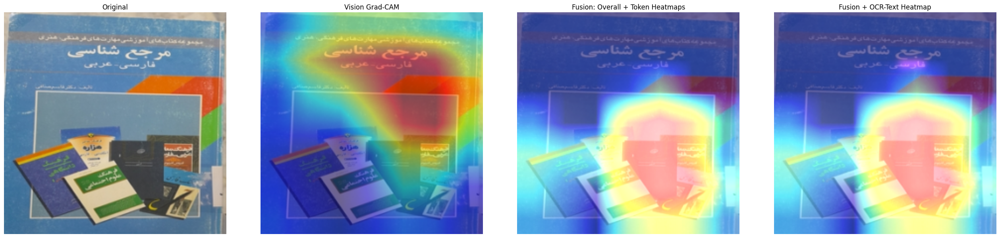

Sample 116
OCR words (n=3): ['مغسزمن در', 'ذمان', 'عذد'] 
Top tokens: ['م', '##س', '##زمن']
Top scores (0..1): [1.    0.321 0.   ]


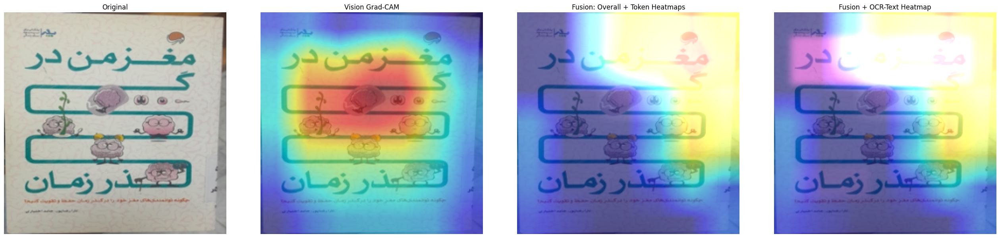

Sample 113
OCR words (n=2): ['آسانها', 'ا'] 
Top tokens: ['آ', '##ها', '##سان']
Top scores (0..1): [1.    0.573 0.   ]


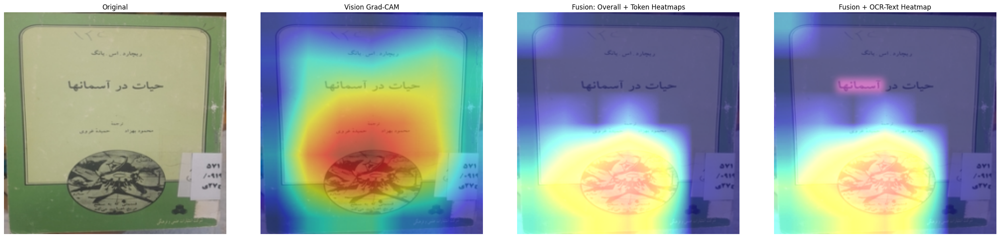

Sample 42
OCR words (n=2): ['مرج تاس اسای', 'ب اذام نئی'] 
Top tokens: ['م', 'تا', 'اس']
Top scores (0..1): [1.    0.007 0.   ]


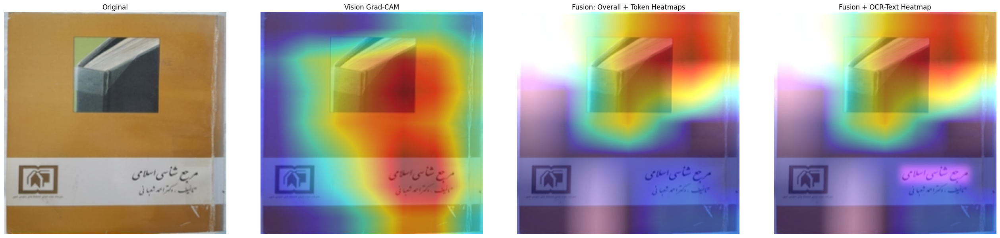

Sample 126
OCR words (n=5): ['راشنماء', 'چههای ایران', 'و', 'مناراان', 'م5>:'] 
Top tokens: ['چه', 'ایران', 'من']
Top scores (0..1): [1.    0.787 0.   ]


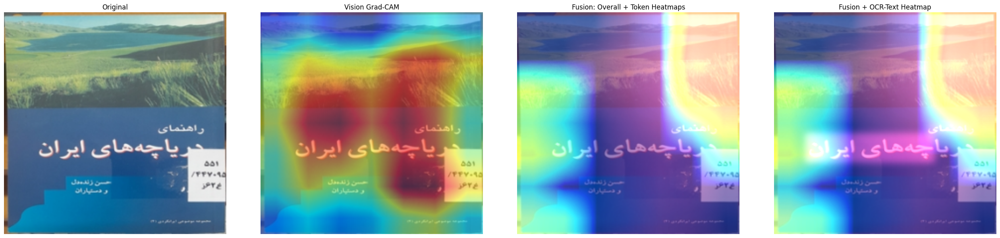

Sample 12
OCR words (n=2): ['بابم برای بم', 'دانةآآنالا'] 
Top tokens: ['باب', '##م', '##آ']
Top scores (0..1): [1.    0.631 0.   ]


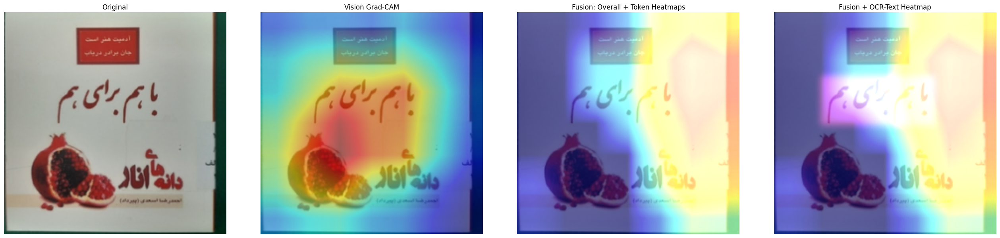

Sample 120
OCR words (n=3): ['لابسترها', 'ورانامما', 'ا'] 
Top tokens: ['و', 'لا', '##ها']
Top scores (0..1): [1.    0.846 0.   ]


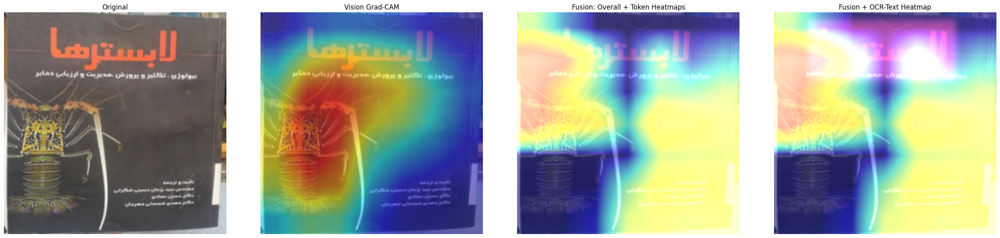

Sample 177
OCR words (n=1): ['ادنت'] 
Top tokens: ['ا', '##دن', '##ت']
Top scores (0..1): [1.    0.016 0.   ]


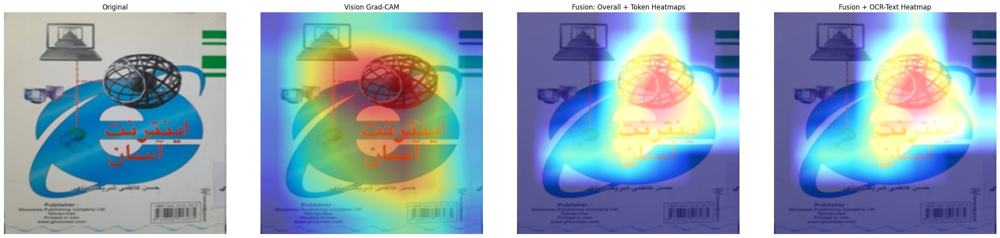

Sample 106
OCR words (n=2): ['نظریهی برنامه ریزی شهری ا', 'دوء+'] 
Top tokens: ['نظریه', 'شهری', 'برنامه']
Top scores (0..1): [1.    0.529 0.   ]


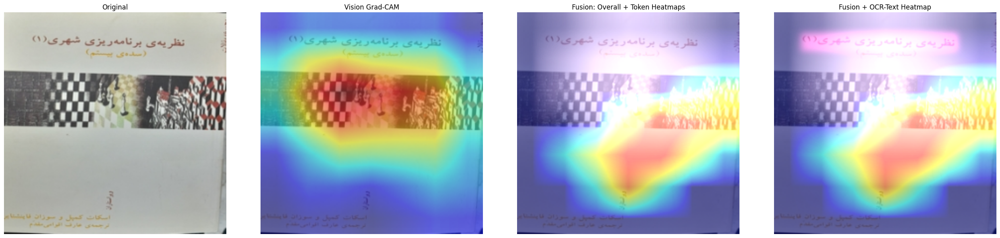

Sample 25
OCR words (n=2): ['اصول کادکرد', 'درک دکئ'] 
Top tokens: ['کا', 'اصول', 'در']
Top scores (0..1): [1.    0.234 0.   ]


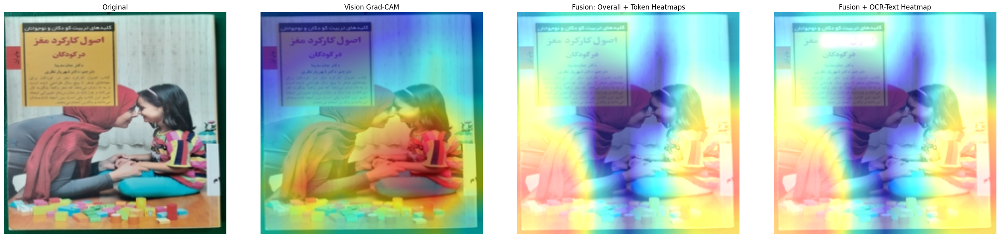

In [ ]:
# -*- coding: utf-8 -*-
import os, re, math, random
import cv2
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms
from transformers import BertTokenizer

# ============ تنظیمات ============
device = "cuda" if torch.cuda.is_available() else "cpu"
OCR_ENGINE = "easyocr"  # "easyocr" یا "tesseract"
USE_EAST_AR = True      # برای EasyOCR: fa+en
TOP_N_TOKENS = 3
SPECIALS = {"[CLS]", "[SEP]", "[PAD]"}
from transformers import BertTokenizerFast
tokenizer = BertTokenizerFast.from_pretrained("bert-base-multilingual-cased")


# اگر Tesseract میخوای:
# pip install pytesseract
# و مسیر tesseract را ست کن اگر لازم شد: pytesseract.pytesseract.tesseract_cmd = "/usr/bin/tesseract"

# ======= Grad-CAM عمومی (Vision یا Fusion) =======
class GradCAM:
    def __init__(self, model, target_layer, gamma=0.6):
        self.model = model.eval()
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.gamma = gamma
        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, inp, out):
        self.activations = out

    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0]

    def __call__(self, inputs, class_idx=None):
        # inputs: (img) یا (img, input_ids, attention_mask) برای فیوژن
        if isinstance(inputs, tuple):
            imgs, input_ids, attention_mask = inputs
            logits, *_ = self.model(imgs, input_ids, attention_mask)  # ← امضای forward فیوژن شما
            feat_size = imgs.shape[2:]
        else:
            imgs = inputs
            logits = self.model(imgs)
            feat_size = imgs.shape[2:]

        if class_idx is None:
            class_idx = int(logits.argmax(dim=1).item())

        self.model.zero_grad(set_to_none=True)
        loss = logits[:, class_idx].sum()
        loss.backward()

        if (self.gradients is None) or (self.activations is None):
            raise RuntimeError("Gradients/activations ثبت نشدن!")

        w = self.gradients.mean(dim=(2, 3), keepdim=True)     # [B,C,1,1]
        cam = (w * self.activations).sum(dim=1, keepdim=True) # [B,1,h,w]
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=feat_size, mode='bilinear', align_corners=False)
        cam = cam.squeeze().detach().cpu().numpy()
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        cam = cam ** self.gamma
        return cam  # [H,W]

# ======= util ها =======
def clean_ocr_text(text: str) -> str:
    text = (text or "").lower()
    text = re.sub(r"[^a-z0-9\sآ-ی]", " ", text)
    stop = {"و","در","به","از","که","برای","این","آن","the","and","of","in","is","to","a"}
    toks = [w for w in text.split() if (w not in stop and len(w)>1)]
    return " ".join(toks).strip()

def colorize_mask(mask, color=(255, 0, 0), alpha=0.40, blur_ks=11):
    # mask: [H,W] 0..1
    if blur_ks and blur_ks > 1:
        mask = cv2.GaussianBlur(mask.astype(np.float32), (blur_ks, blur_ks), 0)
        mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    h, w = mask.shape
    overlay = np.zeros((h, w, 3), dtype=np.float32)
    overlay[..., 0] = color[0] / 255.0
    overlay[..., 1] = color[1] / 255.0
    overlay[..., 2] = color[2] / 255.0
    overlay = overlay * (mask[..., None] * alpha)
    overlay = np.clip(overlay, 0, 1)
    return (overlay * 255).astype(np.uint8)

def blend_over_image(img_pil, overlays):
    base = np.array(img_pil).astype(np.float32) / 255.0
    out = base.copy()
    for ov in overlays:
        ovf = ov.astype(np.float32) / 255.0
        out = np.clip(out + ovf, 0, 1)
    return (out * 255).astype(np.uint8)

def show_cam_on_image(img_pil, mask, alpha=0.50):
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB).astype(np.float32) / 255.0
    img = np.array(img_pil).astype(np.float32) / 255.0
    cam = np.clip(heatmap * alpha + img * (1 - alpha), 0, 1)
    return np.uint8(cam * 255)

PALETTE = [
    (255,  64,  64),   # قرمز
    ( 64, 200,  64),   # سبز
    ( 64, 128, 255),   # آبی
    (255, 160,  32),   # نارنجی
    (160,  64, 255),   # بنفش
]
def pick_color(i): return PALETTE[i % len(PALETTE)]

# ======= OCR =======
def run_ocr(img_path, engine=OCR_ENGINE):
    if engine == "easyocr":
        import easyocr
        langs = ['fa','en'] if USE_EAST_AR else ['en']
        reader = easyocr.Reader(langs, gpu=(device=="cuda"))
        results = reader.readtext(img_path)  # [(bbox, text, conf), ...]
        words, boxes = [], []
        for bbox, text, conf in results:
            t = text.strip()
            if not t: continue
            xs = [p[0] for p in bbox]
            ys = [p[1] for p in bbox]
            x1, y1, x2, y2 = min(xs), min(ys), max(xs), max(ys)
            words.append(t)
            boxes.append([int(x1), int(y1), int(x2), int(y2)])
        return words, boxes

    elif engine == "tesseract":
        import pytesseract
        from pytesseract import Output
        img = cv2.imread(img_path)
        data = pytesseract.image_to_data(img, lang="fas+eng", output_type=Output.DICT)
        words, boxes = [], []
        n = len(data["text"])
        for i in range(n):
            t = data["text"][i].strip()
            if not t: continue
            conf = int(data["conf"][i]) if data["conf"][i].isdigit() else -1
            if conf < 0: continue
            x, y, w, h = data["left"][i], data["top"][i], data["width"][i], data["height"][i]
            words.append(t)
            boxes.append([x, y, x+w, y+h])
        return words, boxes

    else:
        raise ValueError("OCR_ENGINE باید 'easyocr' یا 'tesseract' باشد.")

# ======= اتصال مستقیم BERT از مدل فیوژن =======
def get_bert_from_fusion(fusion_model):
    """
    مسیرهای رایج رو امتحان می‌کنیم؛ اگر فرق داره، یکی رو مطابق مدل خودت برگردون.
    """
    # نمونه‌های متداول:
    candidates = [
        "text_backbone.bert",
        "backbone.bert",
        "bert",
        "nlp_backbone.bert",
    ]
    for path in candidates:
        obj = fusion_model
        ok = True
        for attr in path.split("."):
            if not hasattr(obj, attr):
                ok = False; break
            obj = getattr(obj, attr)
        if ok:
            return obj
    raise AttributeError("BERT داخل fusion_model پیدا نشد؛ مسیر attribute را اصلاح کن.")

@torch.no_grad()
def get_tokens_and_cls_attention_from_fusion(fusion_model, text_clean, max_len=128):
    bert = get_bert_from_fusion(fusion_model)
    enc = tokenizer(text_clean,
                    return_tensors="pt",
                    truncation=True,
                    padding='max_length',
                    max_length=max_len,
                    return_offsets_mapping=True)
    enc = {k: v.to(device) for k, v in enc.items()}
    out = bert(**{k: enc[k] for k in ["input_ids","attention_mask"]},
               output_attentions=True, return_dict=True)
    attn = out.attentions[-1][0]     # [heads, seq, seq]
    attn_mean = attn.mean(dim=0)     # [seq, seq]
    cls_attn = attn_mean[0]          # [seq]
    tokens_dec = tokenizer.convert_ids_to_tokens(enc["input_ids"][0])
    offsets = enc["offset_mapping"][0].cpu().numpy()  # [seq,2]
    return tokens_dec, cls_attn.detach().cpu().numpy(), offsets

# ======= هم‌ترازسازی توکن↔واژه با offset ها =======
def build_word_token_map(words):
    """
    متن نهایی = join با یک فاصله → برای هر کلمه بازه‌ی کاراکتری نگه می‌داریم.
    """
    spans = []
    pos = 0
    for w in words:
        w = w.strip()
        start = pos
        end = start + len(w)
        spans.append((start, end))
        pos = end + 1  # فاصله بعدی
    text = " ".join(words)
    return text, spans

def aggregate_token_attn_to_words(words, word_spans, tokens_dec, cls_attn_vec, token_offsets):
    """
    برای هر کلمه، attention توکن‌هایی که با بازه‌ی آن همپوشانی دارند را میانگین می‌گیریم.
    """
    seq = len(tokens_dec)
    specials = set([tokenizer.cls_token, tokenizer.sep_token, tokenizer.pad_token])
    word_scores = np.zeros(len(words), dtype=np.float32)
    word_counts = np.zeros(len(words), dtype=np.float32)

    for ti in range(seq):
        t = tokens_dec[ti]
        if (t in specials) or (t in SPECIALS):
            continue
        off = token_offsets[ti]  # [start, end]
        ts, te = int(off[0]), int(off[1])
        if te <= ts:  # padding یا بی‌اثر
            continue

        for wi, (ws, we) in enumerate(word_spans):
            # همپوشانی کاراکتری
            inter = max(0, min(we, te) - max(ws, ts))
            if inter > 0:
                word_scores[wi] += float(cls_attn_vec[ti])
                word_counts[wi] += 1.0

    for i in range(len(words)):
        if word_counts[i] > 0:
            word_scores[i] /= word_counts[i]

    # نرمال‌سازی 0..1
    if word_scores.max() > word_scores.min():
        word_scores = (word_scores - word_scores.min()) / (word_scores.max() - word_scores.min() + 1e-8)
    else:
        word_scores[:] = 0.5
    return word_scores

# ======= ساخت ماسک نرم از باکس‌های OCR بر اساس نمره کلمه =======
def rasterize_word_boxes_heatmap(img_hw, boxes, word_scores, blur=15):
    """
    img_hw: (H,W)
    boxes: [[x1,y1,x2,y2],...]
    word_scores: [0..1]
    خروجی: ماسک [H,W] که داخل هر باکس با شدت score پر می‌شود و سپس blur می‌خورد.
    """
    H, W = img_hw
    mask = np.zeros((H, W), dtype=np.float32)
    for (box, s) in zip(boxes, word_scores):
        x1, y1, x2, y2 = map(int, box)
        x1 = np.clip(x1, 0, W-1); x2 = np.clip(x2, 0, W-1)
        y1 = np.clip(y1, 0, H-1); y2 = np.clip(y2, 0, H-1)
        if x2 <= x1 or y2 <= y1: continue
        mask[y1:y2, x1:x2] = np.maximum(mask[y1:y2, x1:x2], float(s))  # max-pool
    if blur and blur > 1 and blur % 2 == 1:
        mask = cv2.GaussianBlur(mask, (blur, blur), 0)
        mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

# ======= پیکره‌بندی رنگ برای توکن‌های برتر =======
def build_token_conditioned_overlays(gradcam_fusion, img_tensor_1x, text_clean, top_token_indices, attn_vec):
    usable = [i for i in top_token_indices if True][:TOP_N_TOKENS]
    overlays, labels = [], []
    if len(usable) == 0: return overlays, labels
    # نرمال‌سازی محلی برای آلفا
    loc = np.array([float(attn_vec[i]) for i in usable], dtype=np.float32)
    if loc.max() > loc.min():
        loc = (loc - loc.min()) / (loc.max() - loc.min() + 1e-8)
    else:
        loc[:] = 1.0

    enc = tokenizer(text_clean, return_tensors='pt', truncation=True,
                    padding='max_length', max_length=128)
    input_ids_full = enc["input_ids"][0]
    attn_full = enc["attention_mask"][0]

    def build_masked(keep_idx):
        PAD_ID = tokenizer.pad_token_id
        MASK_ID = tokenizer.mask_token_id or PAD_ID
        ids = input_ids_full.clone()
        am = attn_full.clone()
        keep = {0, int(keep_idx)}
        sep = (ids == tokenizer.sep_token_id).nonzero(as_tuple=True)[0]
        if len(sep) > 0: keep.add(int(sep[0].item()))
        for i in range(len(ids)):
            if i not in keep:
                ids[i] = MASK_ID
        return ids.unsqueeze(0).to(device), am.unsqueeze(0).to(device)

    for rank, (tok_idx, sc) in enumerate(zip(usable, loc)):
        inp_ids, am = build_masked(tok_idx)
        cam_tok = gradcam_fusion((img_tensor_1x, inp_ids, am))
        cam_tok = (cam_tok - cam_tok.min()) / (cam_tok.max() - cam_tok.min() + 1e-8)
        color = pick_color(rank)
        alpha = 0.30 + 0.25 * float(sc)
        overlays.append(colorize_mask(cam_tok, color=color, alpha=alpha, blur_ks=13))
        labels.append(tok_idx)
    return overlays, labels

# =========================
# ======= استفاده ========
# =========================
# فرض: شما این‌ها را قبلا ساخته‌اید:
# vision_model, text_model, fusion_model, fusion_dataset, samples
# gradcam_vis    = GradCAM(vision_model,  vision_model.backbone.backbone.features.denseblock4, gamma=0.6)
# gradcam_fusion = GradCAM(fusion_model, fusion_model.vision_backbone.backbone.features.denseblock4, gamma=0.6)

for p in fusion_model.vision_backbone.parameters():
    p.requires_grad_(True)
fusion_model.eval()

# رنگ‌بندی نمودار توجه متنی (barh) اختیاریست؛ صرفا برای نمایش
def plot_barh(ax, items, scores, title):
    items = list(items)
    scores = list(scores) if isinstance(scores, (list, np.ndarray)) else []
    ax.barh(items[::-1], scores[::-1] if len(scores)>0 else [])
    ax.set_title(title)

for idx in samples:
    sample = fusion_dataset[idx]
    img_t = sample["image"].unsqueeze(0).to(device)  # [1,3,224,224]
    inv_img = transforms.ToPILImage()(sample["image"])

    # ---------- OCR ----------
    # اگر CSV شما متن دارد، همچنان OCR می‌توانی انجام بدهی تا جای متن دقیق روی تصویر مشخص شود:
    # اگر نمی‌خواهی OCR بزنی، می‌توانی words = text_raw.split() و boxes = [] بگذاری (اما overlay متنی جغرافیا ندارد)
    # اینجا از فایل تصویری ground-truth فرضی داخل دیتاست استفاده می‌کنیم:
    if hasattr(fusion_dataset, "img_paths"):
        img_path = fusion_dataset.img_paths[idx]
    else:
        # اگر path نداری، تصویر را موقت ذخیره می‌کنیم و OCR می‌زنیم
        tmp_path = "_tmp_ocr_img.png"
        inv_img.save(tmp_path)
        img_path = tmp_path

    words, boxes = run_ocr(img_path, engine=OCR_ENGINE)

    # متن تمیزشده (برای BERT)
    # اگر می‌خواهی دقیقا از OCR برای متن استفاده کنی:
    text_from_ocr = " ".join(words)
    text_clean = clean_ocr_text(text_from_ocr)

    # ---------- Attention مستقیم از BERT داخل فیوژن ----------
    tokens_dec, cls_attn_vec, offsets = get_tokens_and_cls_attention_from_fusion(fusion_model, text_clean, max_len=128)

    # انتخاب top-k از همین بردار توجه
    valid_idxs = [i for i,t in enumerate(tokens_dec) if (t not in SPECIALS)]
    if len(valid_idxs) == 0:
        top_token_indices = []
        top_tokens, top_scores = [], []
    else:
        scores_valid = cls_attn_vec[valid_idxs]
        order = np.argsort(-scores_valid)[:max(10, TOP_N_TOKENS)]
        top_token_indices = [valid_idxs[i] for i in order]
        top_tokens = [tokens_dec[i] for i in top_token_indices[:TOP_N_TOKENS]]
        raw_top = scores_valid[order[:TOP_N_TOKENS]]
        if raw_top.max() > raw_top.min():
            top_scores = (raw_top - raw_top.min()) / (raw_top.max() - raw_top.min() + 1e-8)
        else:
            top_scores = np.ones_like(raw_top) * 0.8

    # ---------- Vision Grad-CAM ----------
    cam_vis = gradcam_vis(img_t)
    cam_img_vis = show_cam_on_image(inv_img, cam_vis)

    # ---------- Fusion Grad-CAM (overall) ----------
    enc_full = tokenizer(text_clean, return_tensors='pt', truncation=True, padding='max_length', max_length=128).to(device)
    cam_fus_overall = gradcam_fusion((img_t, enc_full["input_ids"], enc_full["attention_mask"]))
    base_fusion = show_cam_on_image(inv_img, cam_fus_overall)

    # ---------- Fusion Grad-CAM شرطی هر توکن ----------
    tok_overlays, _ = build_token_conditioned_overlays(gradcam_fusion, img_t, text_clean, top_token_indices, cls_attn_vec)
    fusion_with_tokens = blend_over_image(Image.fromarray(base_fusion), tok_overlays)

    # ---------- Heatmap متنی مبتنی بر OCR (بدون نوشتن/باکس) ----------
    H, W = np.array(inv_img).shape[:2]
    # هم‌ترازسازی توکن به واژه‌ها با offset_mapping
    join_text, word_spans = build_word_token_map(words)
    word_scores = aggregate_token_attn_to_words(words, word_spans, tokens_dec, cls_attn_vec, offsets)
    word_mask = rasterize_word_boxes_heatmap((H, W), boxes, word_scores, blur=21)
    # رنگ ثابت برای لایه‌ی متنی (یا می‌تونی colormap بسازی)؛ اینجا قرمز-صورتی ملایم
    text_overlay = colorize_mask(word_mask, color=(255, 64, 128), alpha=0.45, blur_ks=0)
    fusion_plus_text = blend_over_image(Image.fromarray(fusion_with_tokens), [text_overlay])

    # ---------- چاپ اطلاعات ----------
    print("="*100)
    print(f"Sample {idx}")
    print(f"OCR words (n={len(words)}):", words[:30], "..." if len(words)>30 else "")
    print("Top tokens:", top_tokens)
    print("Top scores (0..1):", np.round(top_scores, 3) if len(top_tokens)>0 else [])

    # ---------- نمایش ----------
    fig, ax = plt.subplots(1, 4, figsize=(26, 6))
    ax[0].imshow(inv_img); ax[0].set_title("Original"); ax[0].axis("off")
    ax[1].imshow(cam_img_vis); ax[1].set_title("Vision Grad-CAM"); ax[1].axis("off")
    ax[2].imshow(fusion_with_tokens); ax[2].set_title("Fusion: Overall + Token Heatmaps"); ax[2].axis("off")
    ax[3].imshow(fusion_plus_text); ax[3].set_title("Fusion + OCR-Text Heatmap"); ax[3].axis("off")
    plt.tight_layout(); plt.show()

    # تمیزکاری در صورت ذخیره موقت
    if 'tmp_path' in locals() and os.path.exists(tmp_path):
        try: os.remove(tmp_path)
        except: pass
